# Batch Processing and Dimensionality Reduction on Gaia DR3 (Stars visible for human eye)
This notebook processes the Gaia DR3 subset of stars visible for human eye (apparent magnitude < 6.5).

In [14]:
import pacmap
import trimap
import umap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from astroquery.gaia import Gaia
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

### Batch Processing Configuration

In [15]:
features_for_dr = [
    'parallax', 'pmra', 'pmdec',
    'phot_g_mean_mag', 'bp_rp_color',
    'radial_velocity',
    'phot_bp_mean_mag', 'phot_rp_mean_mag'
]

features_to_color_tuples = [
    ('phot_g_mean_mag', 'G-band Magnitude', 'viridis_r'),
    ('parallax', 'Parallax (mas)', 'plasma'),
    ('bp_rp_color', 'BP-RP Color Index', 'cividis'),
    ('radial_velocity', 'Radial Velocity (km/s)', 'plasma'),
    ('phot_bp_mean_mag', 'BP Magnitude', 'viridis_r'),
    ('phot_rp_mean_mag', 'RP Magnitude', 'plasma'),
]

plotting_feature_names_to_save = list(set([f[0] for f in features_to_color_tuples] + ['source_id']))
output_hdf_file = '../data/gaia_bright_stars.h5'

scaler = StandardScaler()

all_plotting_data_batches = []
all_scaled_features_batches = []

### Batch Data Fetching, Preprocessing

In [16]:
def fetch_gaia_data():
    query = """
    SELECT
    g.source_id, g.ra, g.dec, g.parallax, g.parallax_error, 
    g.pmra, g.pmra_error, g.pmdec, g.pmdec_error,
    g.phot_g_mean_mag, g.phot_bp_mean_mag, g.phot_rp_mean_mag,
    g.radial_velocity, g.radial_velocity_error,
    g.ruwe 
    FROM gaiadr3.gaia_source AS g
    WHERE
    phot_g_mean_mag < 6.5
    ORDER BY g.source_id
    """
    try:
        job = Gaia.launch_job_async(query=query, verbose=False)
        results_table = job.get_results()
        df = results_table.to_pandas()
        return df
    except Exception as e:
        print(f"Error fetching Gaia data: {e}. Returning empty DataFrame.")
        return pd.DataFrame()

In [ ]:
MAX_CONSECUTIVE_EMPTY_BATCHES = 5  # Allow up to 5 consecutive empty/error batches before stopping
EMPTY_BATCH_SLEEP_SEC = 5 # Wait 5 seconds before retrying after an empty/error batch

df_batch = fetch_gaia_data()
df_batch['bp_rp_color'] = df_batch['phot_bp_mean_mag'] - df_batch['phot_rp_mean_mag']

# Add new color indices if not present
if 'bp_g_color' not in df_batch.columns:
    df_batch['bp_g_color'] = df_batch['phot_bp_mean_mag'] - df_batch['phot_g_mean_mag']
if 'g_rp_color' not in df_batch.columns:
    df_batch['g_rp_color'] = df_batch['phot_g_mean_mag'] - df_batch['phot_rp_mean_mag']

batch_features_df = df_batch[features_for_dr].copy()

for col in batch_features_df.columns:
    if batch_features_df[col].isnull().any():
        batch_features_df[col] = batch_features_df[col].fillna(batch_features_df[col].mean())

if batch_features_df.isnull().all().any():
    for pcol in plotting_feature_names_to_save:
        if pcol not in df_batch.columns:
            df_batch[pcol] = np.nan
    all_plotting_data_batches.append(df_batch[plotting_feature_names_to_save].copy())

# Fit scaler on first batch, transform all batches
if len(all_scaled_features_batches) == 0:
    scaled_batch_features = scaler.fit_transform(batch_features_df)
else:
    scaled_batch_features = scaler.transform(batch_features_df)
all_scaled_features_batches.append(scaled_batch_features)

for pcol in plotting_feature_names_to_save:
    if pcol not in df_batch.columns:
        df_batch[pcol] = np.nan

all_plotting_data_batches.append(df_batch[plotting_feature_names_to_save].copy())

INFO: Query finished. [astroquery.utils.tap.core]


### Aggregate Data, Finalize PCA, Run Other DR Methods, and Save Results

In [18]:
full_plotting_df = pd.DataFrame()
pca_embeddings_final = np.array([])
embeddings = {}

if all_plotting_data_batches:
    full_plotting_df = pd.concat(all_plotting_data_batches).reset_index(drop=True)

    if all_scaled_features_batches:
        full_scaled_features = np.concatenate(all_scaled_features_batches, axis=0)
        tsne_perplexity = min(30.0, max(1.0, full_scaled_features.shape[0] - 2.0))

        if full_scaled_features.shape[0] > 1:
            try:
                embeddings['PCA'] = PCA(n_components=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"PCA error: {e}")
            try:
                embeddings['tSNE'] = TSNE(n_components=2, perplexity=tsne_perplexity, n_jobs=8).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"t-SNE error: {e}")
            try:
                embeddings['UMAP'] = umap.UMAP(n_components=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"UMAP error: {e}")
            try:
                embeddings['PaCMAP'] = pacmap.PaCMAP(n_components=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"PaCMAP error: {e}")
            try:
                embeddings['TriMap'] = trimap.TRIMAP(n_dims=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"TriMap error: {e}")

        # Save to HDF5
        try:
            with pd.HDFStore(output_hdf_file, 'w') as store:
                store.put('plotting_data', full_plotting_df, format='table', data_columns=True)
                for dr_name, emb_data in embeddings.items():
                    if emb_data.shape[0] > 0:
                        store.put(f'{dr_name.lower()}_embeddings', pd.DataFrame(emb_data, columns=[f'{dr_name}1', f'{dr_name}2']))
        except Exception as e:
            print(f"Error saving to HDF5: {e}")

C:\Users\looxx\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [19]:
full_scaled_features.shape

(12119, 8)

### Visualize PCA, t-SNE, UMAP, PaCMAP and TRIMAP

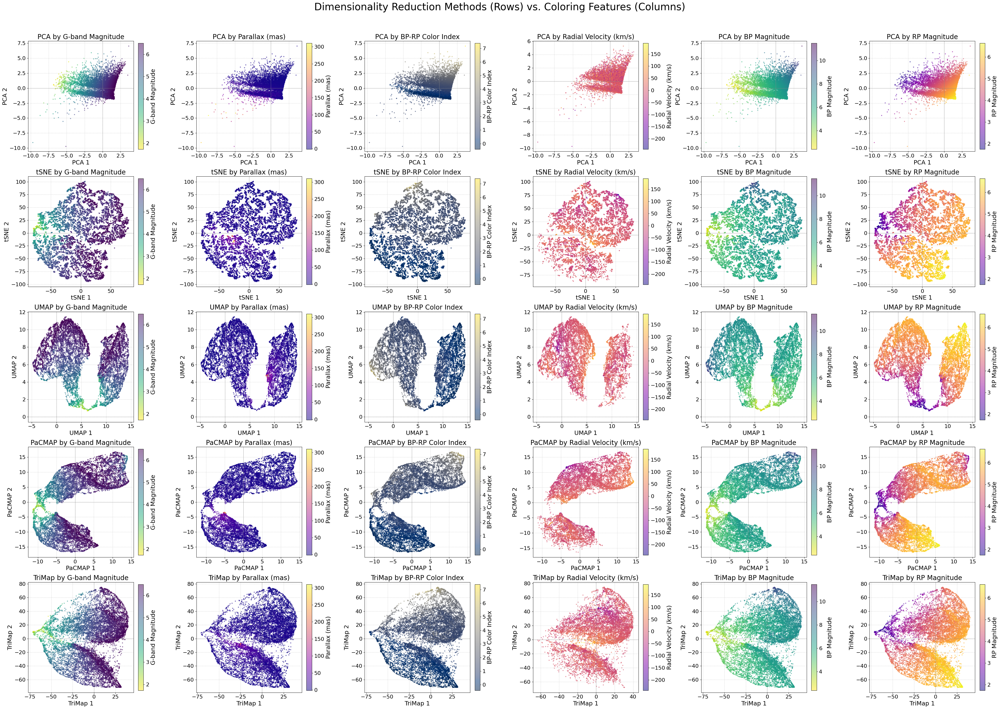

In [ ]:
if embeddings and not full_plotting_df.empty:
    n_methods = len(embeddings)
    n_features_to_plot = len(features_to_color_tuples)
    num_points = embeddings[list(embeddings.keys())[0]].shape[0] if embeddings else 0
    marker_size = max(1, 20 / np.log10(max(10, num_points))) if num_points > 0 else 5
    fig, axes = plt.subplots(n_methods, n_features_to_plot, figsize=(7*n_features_to_plot, 6*n_methods), squeeze=False)

    title_fontsize = 20
    label_fontsize = 18
    suptitle_fontsize = 30

    for row_idx, (method_name, emb_data) in enumerate(embeddings.items()):
        for col_idx, (feature_name, feature_label, cmap) in enumerate(features_to_color_tuples):
            ax = axes[row_idx][col_idx]
            if feature_name not in full_plotting_df.columns:
                ax.set_title(f'{method_name} - Missing: {feature_label}', fontsize=title_fontsize)
                ax.text(0.5, 0.5, f'Missing:\n{feature_label}', ha='center', va='center', transform=ax.transAxes, fontsize=label_fontsize)
                continue
            
            color_values = full_plotting_df[feature_name]
            current_emb_data = emb_data
            current_color_values = color_values

            if len(emb_data) != len(color_values):
                min_len = min(len(emb_data), len(color_values))
                current_emb_data = emb_data[:min_len]
                current_color_values = color_values[:min_len]
                if min_len == 0:
                    ax.set_title(f'{method_name} by {feature_label} (No data)', fontsize=title_fontsize)
                    continue
            
            if current_color_values.isnull().all():
                scatter = ax.scatter(current_emb_data[:, 0], current_emb_data[:, 1], alpha=0.5, s=marker_size, color='grey')
            else:
                scatter = ax.scatter(current_emb_data[:, 0], current_emb_data[:, 1], c=current_color_values, cmap=cmap, alpha=0.5, s=marker_size)
            
            ax.set_xlabel(f'{method_name} 1', fontsize=label_fontsize)
            ax.set_ylabel(f'{method_name} 2', fontsize=label_fontsize)
            ax.set_title(f'{method_name} by {feature_label}', fontsize=title_fontsize)
            
            try:
                cbar = fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)
                cbar.set_label(feature_label, fontsize=label_fontsize)
                cbar.ax.tick_params(labelsize=label_fontsize-2)
            except Exception as e:
                print(f"Could not create colorbar for {method_name} by {feature_label}: {e}")
            
            ax.grid(True, linestyle='--', alpha=0.5)
            ax.axhline(0, color='grey', lw=0.5)
            ax.axvline(0, color='grey', lw=0.5)
            ax.tick_params(axis='both', which='major', labelsize=label_fontsize-2)

    plt.suptitle('Dimensionality Reduction Methods (Rows) vs. Coloring Features (Columns)', fontsize=suptitle_fontsize, y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

## Investigate PaCMAP Clusters by BP-RP Color Index
Let's take a closer look at how the BP-RP color index relates to the two PaCMAP clusters. We'll:
- Assign clusters using KMeans on the PaCMAP embedding
- Plot the embedding colored by cluster and by BP-RP color (with different colormaps and scales)
- Plot histograms of BP-RP color for each cluster

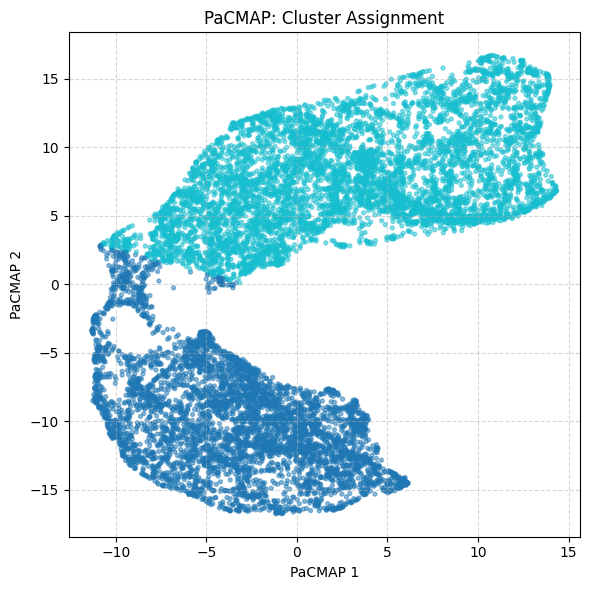

In [ ]:
# Only proceed if PaCMAP embedding and bp_rp_color are available
if 'PaCMAP' in embeddings and 'bp_rp_color' in full_plotting_df.columns:
    X = embeddings['PaCMAP']
    # KMeans clustering (2 clusters)
    kmeans = KMeans(n_clusters=2, random_state=42, n_init='auto')
    cluster_labels = kmeans.fit_predict(X)
    full_plotting_df['pacmap_cluster'] = cluster_labels

    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    # PaCMAP colored by cluster
    scatter0 = ax.scatter(X[:,0], X[:,1], c=cluster_labels, cmap='tab10', alpha=0.5, s=8)
    ax.set_title('PaCMAP: Cluster Assignment')
    ax.set_xlabel('PaCMAP 1')
    ax.set_ylabel('PaCMAP 2')
    ax.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()
else:
    print('PaCMAP embedding or BP-RP color index not available.')

## Color-Magnitude Diagram (CMD) for Each PaCMAP Cluster
Visualize the CMD (G-band magnitude vs. BP-RP color) for each cluster to see if they correspond to different stellar populations.

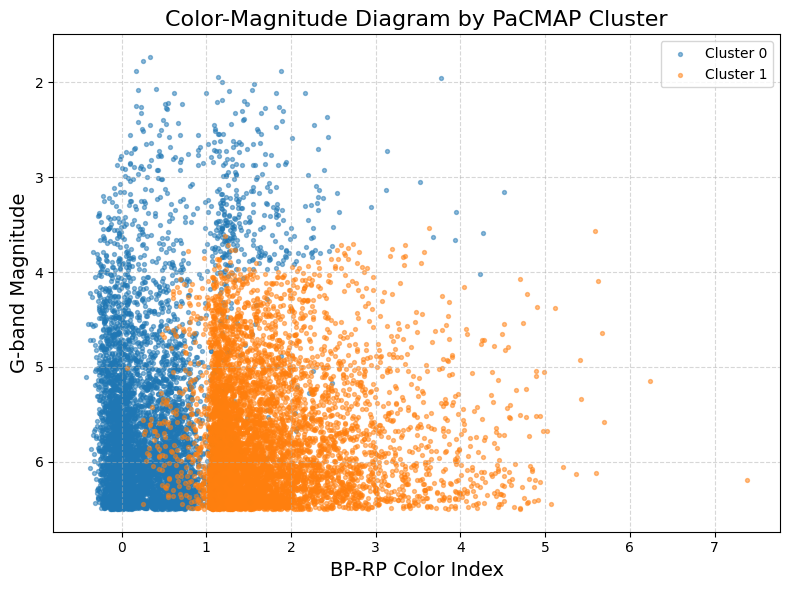

In [22]:
# Only proceed if required columns are present
if all(col in full_plotting_df.columns for col in ['bp_rp_color', 'phot_g_mean_mag', 'pacmap_cluster']):
    plt.figure(figsize=(8,6))
    for cl in np.unique(full_plotting_df['pacmap_cluster']):
        cluster_mask = full_plotting_df['pacmap_cluster'] == cl
        plt.scatter(full_plotting_df.loc[cluster_mask, 'bp_rp_color'],
                    full_plotting_df.loc[cluster_mask, 'phot_g_mean_mag'],
                    s=8, alpha=0.5, label=f'Cluster {cl}')
    plt.gca().invert_yaxis()
    plt.xlabel('BP-RP Color Index', fontsize=14)
    plt.ylabel('G-band Magnitude', fontsize=14)
    plt.title('Color-Magnitude Diagram by PaCMAP Cluster', fontsize=16)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
else:
    print('Required columns for CMD not available.')

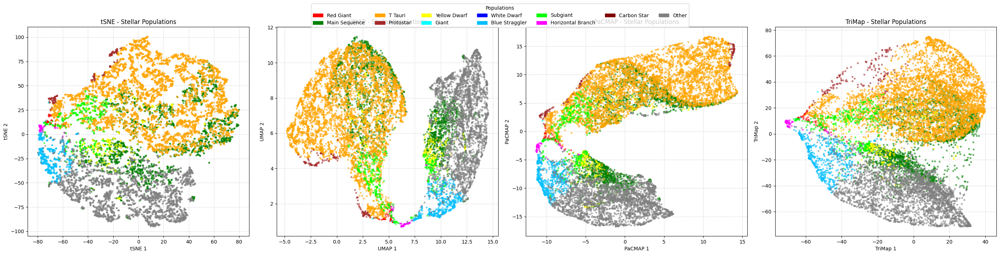

In [23]:
# Define masks for various stellar populations (approximate Gaia DR3 cuts)
# White dwarfs: very blue and faint
wd_mask = (full_plotting_df['bp_rp_color'] < 0.3) & (full_plotting_df['phot_g_mean_mag'] > 10)

# Blue stragglers: very blue, brighter than main sequence
bs_mask = (full_plotting_df['bp_rp_color'] < 0.3) & (full_plotting_df['phot_g_mean_mag'] < 5)

# Subgiants: intermediate color and brightness
subgiant_mask = (
    (full_plotting_df['bp_rp_color'] > 0.5) & (full_plotting_df['bp_rp_color'] < 1.2) &
    (full_plotting_df['phot_g_mean_mag'] > 2) & (full_plotting_df['phot_g_mean_mag'] < 5)
)

# Horizontal branch: blue to yellow, intermediate brightness
hb_mask = (
    (full_plotting_df['bp_rp_color'] > 0.0) & (full_plotting_df['bp_rp_color'] < 0.8) &
    (full_plotting_df['phot_g_mean_mag'] > 0) & (full_plotting_df['phot_g_mean_mag'] < 3)
)

# Carbon stars: very red, faint or bright
carbon_mask = (full_plotting_df['bp_rp_color'] > 2.5)

# Refined existing masks
rg_mask = (full_plotting_df['bp_rp_color'] > 1.2) & (full_plotting_df['phot_g_mean_mag'] < 5)
ms_mask = (
    (full_plotting_df['bp_rp_color'] > 0.5) & (full_plotting_df['bp_rp_color'] < 1.5) &
    (full_plotting_df['phot_g_mean_mag'] > 5) & (full_plotting_df['phot_g_mean_mag'] < 10)
)
ttauri_mask = (
    (full_plotting_df['bp_rp_color'] > 1.2) &
    (full_plotting_df['phot_g_mean_mag'] > 3) & (full_plotting_df['phot_g_mean_mag'] < 8)
)
protostar_mask = (
    (full_plotting_df['bp_rp_color'] > 2.5) &
    (full_plotting_df['phot_g_mean_mag'] < 5)
)
yellow_dwarf_mask = (
    (full_plotting_df['bp_rp_color'] > 0.7) & (full_plotting_df['bp_rp_color'] < 1.0) &
    (full_plotting_df['phot_g_mean_mag'] > 4) & (full_plotting_df['phot_g_mean_mag'] < 6)
)
giant_mask = (
    (full_plotting_df['bp_rp_color'] > 1.0) &
    (full_plotting_df['phot_g_mean_mag'] < 2)
)

# Assign labels with new and refined categories
population_labels = np.full(len(full_plotting_df), 'Other', dtype=object)
population_labels[wd_mask] = 'White Dwarf'
population_labels[bs_mask] = 'Blue Straggler'
population_labels[subgiant_mask] = 'Subgiant'
population_labels[hb_mask] = 'Horizontal Branch'
population_labels[carbon_mask] = 'Carbon Star'
population_labels[rg_mask] = 'Red Giant'
population_labels[ms_mask] = 'Main Sequence'
population_labels[ttauri_mask] = 'T Tauri'
population_labels[protostar_mask] = 'Protostar'
population_labels[yellow_dwarf_mask] = 'Yellow Dwarf'
population_labels[giant_mask] = 'Giant'

colors = {
    'Red Giant': 'red',
    'Main Sequence': 'green',
    'T Tauri': 'orange',
    'Protostar': 'brown',
    'Yellow Dwarf': 'yellow',
    'Giant': 'cyan',
    'White Dwarf': 'blue',
    'Blue Straggler': 'deepskyblue',
    'Subgiant': 'lime',
    'Horizontal Branch': 'magenta',
    'Carbon Star': 'maroon',
    'Other': 'grey'
}

dr_methods = list(embeddings.keys())
dr_methods = [method for method in dr_methods if method not in ['PCA']]  # Exclude PCA
n_methods = len(dr_methods)
ncols = n_methods
nrows = 1

fig, axes = plt.subplots(nrows, ncols, figsize=(7*ncols, 7*nrows), squeeze=False, sharex=False, sharey=False)

for idx, method_name in enumerate(dr_methods):
    row = idx // ncols
    col = idx % ncols
    ax = axes[row][col]
    emb_data = embeddings[method_name]
    for pop, color in colors.items():
        mask = (population_labels == pop)
        if np.any(mask):
            ax.scatter(
                emb_data[mask, 0], emb_data[mask, 1],
                s=8, alpha=0.5, label=pop, color=color
            )
    ax.set_xlabel(f'{method_name} 1')
    ax.set_ylabel(f'{method_name} 2')
    ax.set_title(f'{method_name} - Stellar Populations')
    ax.grid(True, linestyle='--', alpha=0.5)

# Hide unused subplots if any
for idx in range(n_methods, nrows * ncols):
    fig.delaxes(axes[idx // ncols][idx % ncols])

# Create a single legend for all populations
handles = [mpatches.Patch(color=color, label=pop) for pop, color in colors.items()]
fig.legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=7, fontsize=10, title="Populations")

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

## Visualize DR Embeddings by Harvard Spectral Type
Plot the DR embeddings colored by Harvard spectral class, using BP-RP color cuts for O, B, A, F, G, K, M types (Harvard system).

C:\Users\looxx\AppData\Local\Temp\ipykernel_2456\1130380443.py:53: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 1.5, 1, 1.08])


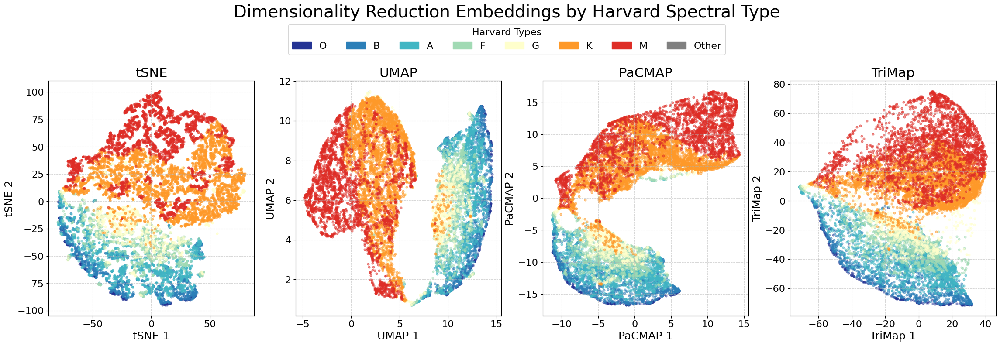

In [ ]:
# Harvard Spectral Type Masking
harvard_types = [
    ('O', (full_plotting_df['bp_rp_color'] < -0.2)),
    ('B', (full_plotting_df['bp_rp_color'] >= -0.2) & (full_plotting_df['bp_rp_color'] < 0.0)),
    ('A', (full_plotting_df['bp_rp_color'] >= 0.0) & (full_plotting_df['bp_rp_color'] < 0.3)),
    ('F', (full_plotting_df['bp_rp_color'] >= 0.3) & (full_plotting_df['bp_rp_color'] < 0.6)),
    ('G', (full_plotting_df['bp_rp_color'] >= 0.6) & (full_plotting_df['bp_rp_color'] < 1.0)),
    ('K', (full_plotting_df['bp_rp_color'] >= 1.0) & (full_plotting_df['bp_rp_color'] < 1.6)),
    ('M', (full_plotting_df['bp_rp_color'] >= 1.6)),
]

harvard_labels = np.full(len(full_plotting_df), 'Other', dtype=object)

for htype, mask in harvard_types:
    harvard_labels[mask] = htype

harvard_colors = {
    'O': '#253494',  # deep blue
    'B': '#2c7fb8',  # blue
    'A': '#41b6c4',  # cyan
    'F': '#a1dab4',  # light green
    'G': '#ffffcc',  # yellow
    'K': '#fe9929',  # orange
    'M': '#de2d26',  # red
    'Other': 'grey'
}

title_fontsize = 22
label_fontsize = 18
legend_fontsize = 16
suptitle_fontsize = 28

# Plot DR embeddings by Harvard type
n_methods = len(dr_methods)
fig, axes = plt.subplots(1, n_methods, figsize=(7*n_methods, 7), squeeze=False)

for idx, method_name in enumerate(dr_methods):
    ax = axes[0][idx]
    emb_data = embeddings[method_name]

    for htype, color in harvard_colors.items():
        mask = (harvard_labels == htype)
        if np.any(mask):
            ax.scatter(
                emb_data[mask, 0], emb_data[mask, 1],
                s=12, alpha=0.5, label=htype, color=color
            )

    ax.set_xlabel(f'{method_name} 1', fontsize=label_fontsize)
    ax.set_ylabel(f'{method_name} 2', fontsize=label_fontsize)
    ax.set_title(f'{method_name}', fontsize=title_fontsize)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.tick_params(axis='both', which='major', labelsize=label_fontsize-2)

# Single legend
handles = [mpatches.Patch(color=color, label=htype) for htype, color in harvard_colors.items()]
fig.legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, 1.08), ncol=8, fontsize=legend_fontsize, title="Harvard Types", title_fontsize=legend_fontsize)

plt.suptitle('Dimensionality Reduction Embeddings by Harvard Spectral Type', fontsize=suptitle_fontsize, y=1.13)
plt.tight_layout(rect=[0, 1.5, 1, 1.08])
plt.show()

## Visualize DR Embeddings by Luminosity Class (Dwarfs vs. Giants)
Separate stars into Dwarfs (V) and Giants (III/I) using a sloped boundary in the CMD, and plot DR embeddings colored by luminosity class.

C:\Users\looxx\AppData\Local\Temp\ipykernel_2456\4109243444.py:38: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 2, 1, 0.97])


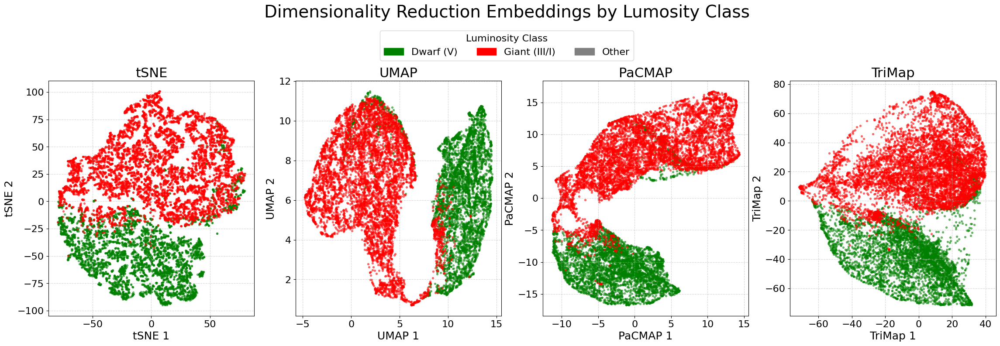

In [ ]:
# Luminosity Class Masking (Dwarfs vs. Giants)
lum_class = np.full(len(full_plotting_df), 'Other', dtype=object)
ms_boundary = 6.0 + 2.5 * (full_plotting_df['bp_rp_color'] - 1.00)
lum_class[full_plotting_df['phot_g_mean_mag'] > ms_boundary] = 'Dwarf (V)'
lum_class[full_plotting_df['phot_g_mean_mag'] <= ms_boundary] = 'Giant (III/I)'
lum_colors = {
    'Dwarf (V)': 'green',
    'Giant (III/I)': 'red',
    'Other': 'grey'
}

title_fontsize = 22
label_fontsize = 18
legend_fontsize = 16

# Plot DR embeddings by luminosity class
n_methods = len(dr_methods)
fig, axes = plt.subplots(1, n_methods, figsize=(7*n_methods, 7), squeeze=False)
for idx, method_name in enumerate(dr_methods):
    ax = axes[0][idx]
    emb_data = embeddings[method_name]
    for lclass, color in lum_colors.items():
        mask = (lum_class == lclass)
        if np.any(mask):
            ax.scatter(
                emb_data[mask, 0], emb_data[mask, 1],
                s=8, alpha=0.5, label=lclass, color=color
            )
    ax.set_xlabel(f'{method_name} 1', fontsize=label_fontsize)
    ax.set_ylabel(f'{method_name} 2', fontsize=label_fontsize)
    ax.set_title(f'{method_name}', fontsize=title_fontsize)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.tick_params(axis='both', which='major', labelsize=label_fontsize-2)

# Single legend
handles = [mpatches.Patch(color=color, label=lclass) for lclass, color in lum_colors.items()]
fig.legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, 1.06), ncol=3, fontsize=legend_fontsize, title="Luminosity Class", title_fontsize=legend_fontsize)

plt.suptitle('Dimensionality Reduction Embeddings by Lumosity Class', fontsize=suptitle_fontsize, y=1.13)
plt.tight_layout(rect=[0, 2, 1, 0.97])
plt.show()

## Compare Optimized and Standard Literature Luminosity Class Boundaries
This cell overlays optimized boundary and a standard literature-based main sequence/giant boundary on the CMD for direct comparison.

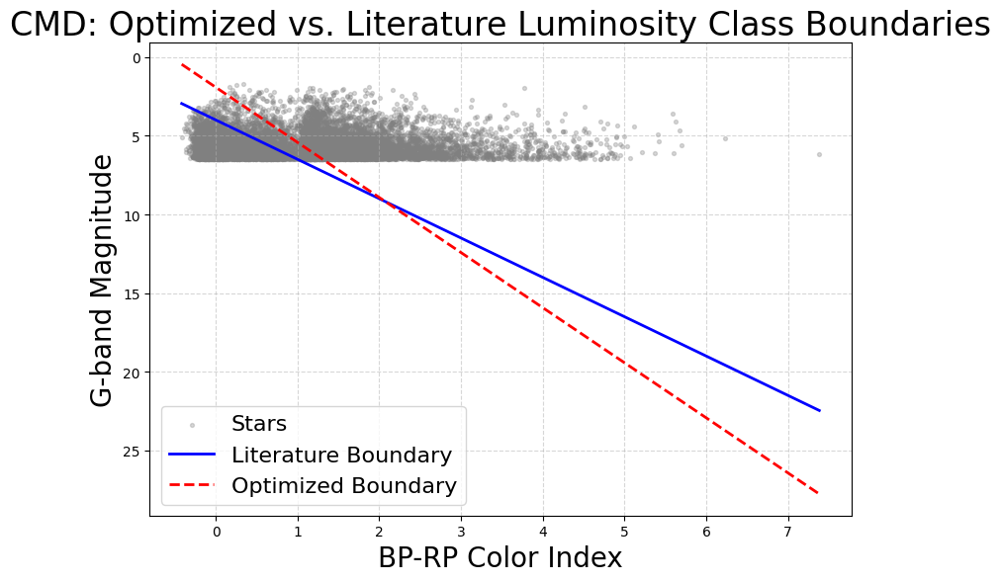

In [ ]:
# Standard literature boundary
lit_intercept = 6.5
lit_slope = 2.5
lit_ref_color = 1.0

# Optimized boundary
opt_intercept = 7.0
opt_slope = 3.5
opt_ref_color = 1.45

xgrid = np.linspace(full_plotting_df['bp_rp_color'].min(), full_plotting_df['bp_rp_color'].max(), 200)
lit_boundary = lit_intercept + lit_slope * (xgrid - lit_ref_color)
opt_boundary = opt_intercept + opt_slope * (xgrid - opt_ref_color)

plt.figure(figsize=(8,6))
plt.scatter(full_plotting_df['bp_rp_color'], full_plotting_df['phot_g_mean_mag'], c='grey', s=8, alpha=0.3, label='Stars')
plt.plot(xgrid, lit_boundary, 'b-', label='Literature Boundary', linewidth=2)
plt.plot(xgrid, opt_boundary, 'r--', label='Optimized Boundary', linewidth=2)
plt.gca().invert_yaxis()
plt.xlabel('BP-RP Color Index', fontsize=20)
plt.ylabel('G-band Magnitude', fontsize=20)
plt.title('CMD: Optimized vs. Literature Luminosity Class Boundaries', fontsize=24)
plt.legend(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
